# Covid-19 Data Analysis

## What is COVID-19?

> Coronaviruses are a large family of viruses that may cause respiratory illnesses in humans ranging from common colds to more severe conditions such as Severe Acute Respiratory Syndrome (SARS) and Middle Eastern Respiratory Syndrome (MERS).1
'Novel coronavirus' is a new, previously unidentified strain of coronavirus. The novel coronavirus involved in the current outbreak has been named SARS-CoV-2 by the World Health Organization (WHO). 3The disease it causes has been named “coronavirus disease 2019” (or “COVID-19”).`

![Coronavirus particle Image](https://www.vtc.edu/wp-content/uploads/2020/07/COVID-banner.jpg)

### Importing the libraries

In [1]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.core.display import display, HTML

import pandas as pd 
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium import plugins

import ipywidgets as widgets
import pycountry_convert as pc
import branca
from scipy.interpolate import make_interp_spline, BSpline
import json, requests
import calmap

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

## Data Preprocessing

### Loading the datasets

Converting the data types of 'ObservationDate' and 'Last Update' to datetime using parse_dates parameter

In [2]:
covid_df = pd.read_csv('Covid_19_data.csv', parse_dates=['ObservationDate', 'Last Update'])
covid_df.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0
2,3,2020-01-22,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0
3,4,2020-01-22,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
4,5,2020-01-22,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0


In [3]:
confirmed_df = pd.read_csv('time_series_covid_19_confirmed.csv')
death_df = pd.read_csv('time_series_covid_19_deaths.csv')
recovered_df = pd.read_csv('time_series_covid_19_recovered.csv')

In [4]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,64575,65080,65486,65728,66275,66903,67743,68366,69130,70111
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132118,132153,132176,132209,132215,132229,132244,132264,132285,132297
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,126156,126434,126651,126860,127107,127361,127646,127926,128198,128456
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13569,13569,13569,13569,13569,13664,13671,13682,13693,13693
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,31661,31909,32149,32441,32623,32933,33338,33607,33944,34180


In [5]:
death_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,2772,2782,2792,2802,2812,2836,2855,2869,2881,2899
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2440,2441,2442,2444,2445,2447,2447,2447,2448,2449
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,3401,3405,3411,3418,3426,3433,3440,3448,3455,3460
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,127,127,127,127,127,127,127,127,127,127
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,704,709,715,725,731,735,742,745,749,757


In [6]:
recovered_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,55687,55790,55889,56035,56295,56518,56711,56962,57119,57281
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,127869,128425,128601,128732,128826,128907,128978,129042,129097,129215
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,87902,88066,88208,88346,88497,88672,88861,89040,89232,89419
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13234,13234,13234,13234,13234,13263,13381,13405,13416,13416
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,26483,26513,26775,26778,27087,27204,27467,27529,27577,27646


In [7]:
covid_df.rename(columns = {'Last Update':'last_update', 'Country/Region': 'country'}, inplace = True)
covid_df.columns = map(str.lower, covid_df.columns)
confirmed_df.rename(columns = {'Country/Region': 'country'}, inplace = True)
confirmed_df.columns = map(str.lower, confirmed_df.columns)
death_df.rename(columns = {'Country/Region': 'country'}, inplace = True)
death_df.columns = map(str.lower, death_df.columns)
recovered_df.rename(columns = {'Country/Region': 'country'}, inplace = True)
recovered_df.columns = map(str.lower, recovered_df.columns)
covid_df.head()

,sno,observationdate,province/state,country,last_update,confirmed,deaths,recovered
0,1,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0
2,3,2020-01-22,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0
3,4,2020-01-22,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
4,5,2020-01-22,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0


### Checking the dataset shape and info 

In [8]:
covid_df.shape

(306429, 8)

In [9]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306429 entries, 0 to 306428
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   sno              306429 non-null  int64         
 1   observationdate  306429 non-null  datetime64[ns]
 2   province/state   228329 non-null  object        
 3   country          306429 non-null  object        
 4   last_update      306429 non-null  datetime64[ns]
 5   confirmed        306429 non-null  float64       
 6   deaths           306429 non-null  float64       
 7   recovered        306429 non-null  float64       
dtypes: datetime64[ns](2), float64(3), int64(1), object(2)
memory usage: 18.7+ MB


### Adding a new column named 'active' to show the number of active cases

In [10]:
covid_df['active'] = covid_df['confirmed'] - covid_df['deaths'] - covid_df['recovered'] 
covid_df.head(10)

,sno,observationdate,province/state,country,last_update,confirmed,deaths,recovered,active
0,1,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
1,2,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0
2,3,2020-01-22,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0
3,4,2020-01-22,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
4,5,2020-01-22,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0
5,6,2020-01-22,Guangdong,Mainland China,2020-01-22 17:00:00,26.0,0.0,0.0,26.0
6,7,2020-01-22,Guangxi,Mainland China,2020-01-22 17:00:00,2.0,0.0,0.0,2.0
7,8,2020-01-22,Guizhou,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
8,9,2020-01-22,Hainan,Mainland China,2020-01-22 17:00:00,4.0,0.0,0.0,4.0
9,10,2020-01-22,Hebei,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0


### Searching for null values and dropping the unnecessary columns

In [11]:
covid_df.isnull().sum()

sno                    0
observationdate        0
province/state     78100
country                0
last_update            0
confirmed              0
deaths                 0
recovered              0
active                 0
dtype: int64

**As the province and state column has 78100 missing values which cannot be replaced by any other value, we drop the column**

**To get the unique values we also remove the serial numbers**

In [12]:
covid_df.drop(columns = ["province/state", 'sno'], axis = 1, inplace=True)
covid_df.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active
0,2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
1,2020-01-22,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0
2,2020-01-22,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0
3,2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
4,2020-01-22,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0


In [13]:
confirmed_df.drop(columns = ["province/state"], axis = 1, inplace=True)
confirmed_df.dropna(inplace=True)
confirmed_df.head()

,country,lat,long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,...,64575,65080,65486,65728,66275,66903,67743,68366,69130,70111
1,Albania,41.15330,20.168300,0,0,0,0,0,0,0,...,132118,132153,132176,132209,132215,132229,132244,132264,132285,132297
2,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,...,126156,126434,126651,126860,127107,127361,127646,127926,128198,128456
3,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,...,13569,13569,13569,13569,13569,13664,13671,13682,13693,13693
4,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,...,31661,31909,32149,32441,32623,32933,33338,33607,33944,34180


In [14]:
death_df.drop(columns = ["province/state"], axis = 1, inplace=True)
death_df.dropna(inplace=True)
death_df.head()

,country,lat,long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,...,2772,2782,2792,2802,2812,2836,2855,2869,2881,2899
1,Albania,41.15330,20.168300,0,0,0,0,0,0,0,...,2440,2441,2442,2444,2445,2447,2447,2447,2448,2449
2,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,...,3401,3405,3411,3418,3426,3433,3440,3448,3455,3460
3,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,...,127,127,127,127,127,127,127,127,127,127
4,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,...,704,709,715,725,731,735,742,745,749,757


In [15]:
recovered_df.drop(columns = ["province/state"], axis = 1, inplace=True)
recovered_df.dropna(inplace=True)
recovered_df.head()

,country,lat,long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,...,55687,55790,55889,56035,56295,56518,56711,56962,57119,57281
1,Albania,41.15330,20.168300,0,0,0,0,0,0,0,...,127869,128425,128601,128732,128826,128907,128978,129042,129097,129215
2,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,...,87902,88066,88208,88346,88497,88672,88861,89040,89232,89419
3,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,...,13234,13234,13234,13234,13234,13263,13381,13405,13416,13416
4,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,...,26483,26513,26775,26778,27087,27204,27467,27529,27577,27646


In [16]:
covid_df.shape

(306429, 7)

In [17]:
covid_df.duplicated().sum()

781

In [18]:
covid_df = covid_df.drop_duplicates()
covid_df.duplicated().sum()

0

In [19]:
covid_df.shape

(305648, 7)

### Statistical description of the data

In [20]:
covid_df.describe()

,confirmed,deaths,recovered,active
count,3.056480e+05,305648.000000,3.056480e+05,3.056480e+05
mean,8.588981e+04,2041.606668,5.054911e+04,3.329909e+04
std,2.778722e+05,6418.296032,2.017536e+05,2.125181e+05
min,-3.028440e+05,-178.000000,-8.544050e+05,-6.399531e+06
25%,1.060000e+03,13.000000,1.200000e+01,1.140000e+02
50%,1.047250e+04,194.000000,1.781000e+03,1.607000e+03
75%,5.097225e+04,1330.000000,2.041450e+04,1.248400e+04
max,5.863138e+06,112385.000000,6.399531e+06,5.431304e+06


We observe some negative values in the statistical description of the data and try to remove/replace those values according to our need.

### Removing Garbage Values

In [21]:
covid_df[covid_df['confirmed'] < 0]

,observationdate,country,last_update,confirmed,deaths,recovered,active
147524,2020-11-02,Colombia,2021-04-02 15:13:53,-302844.0,0.0,0.0,-302844.0


In [22]:
covid_df.drop(labels = 147524, axis = 0, inplace=True)

In [23]:
covid_df[covid_df['deaths'] < 0] 

,observationdate,country,last_update,confirmed,deaths,recovered,active
118363,2020-09-24,Colombia,2021-04-02 15:13:53,0.0,-178.0,-12684.0,12862.0
141534,2020-10-25,Colombia,2021-04-02 15:13:53,0.0,-154.0,-8072.0,8226.0


In [24]:
covid_df.drop(labels = [118363, 141534], axis = 0, inplace=True)

In [25]:
covid_df[covid_df['recovered'] < 0] 

,observationdate,country,last_update,confirmed,deaths,recovered,active
145277,2020-10-30,Colombia,2021-04-02 15:13:53,0.0,505.0,-854405.0,853900.0


In [26]:
covid_df.drop(labels = [145277], axis = 0, inplace=True)

In [27]:
covid_df[covid_df['confirmed'] < 0].sum() 
covid_df[covid_df['deaths'] < 0].sum() 
covid_df[covid_df['recovered'] < 0].sum()

observationdate    0.0
country            0.0
last_update        0.0
confirmed          0.0
deaths             0.0
recovered          0.0
active             0.0
dtype: float64

In [28]:
# Checking if the negative values are removed.

covid_df.describe()

,confirmed,deaths,recovered,active
count,3.056440e+05,305644.000000,3.056440e+05,3.056440e+05
mean,8.589192e+04,2041.632821,5.055264e+04,3.329765e+04
std,2.778730e+05,6418.333882,2.017482e+05,2.125134e+05
min,0.000000e+00,0.000000,0.000000e+00,-6.399531e+06
25%,1.060000e+03,13.000000,1.200000e+01,1.140000e+02
50%,1.047300e+04,194.000000,1.782000e+03,1.607000e+03
75%,5.097375e+04,1330.000000,2.041650e+04,1.248400e+04
max,5.863138e+06,112385.000000,6.399531e+06,5.431304e+06


### Finding out the first date and last date of the dataset

In [29]:
display(HTML("<div style = 'background-color: Lightgray; padding: 30px '>" +
             "<span style='color: DarkRed; font-size:30px;margin-left:20px;'> We have data available from : " +"<br>"  +
             "<span style='color: black; font-size:30px;margin-left:20px;'>" + str(covid_df['observationdate'].min()) +
             "<span style='color: DarkRed;'> to" + "<br>" +
             "<span style='color: black; font-size:30px;margin-left:20px;'> " + str(covid_df['observationdate'].max()) +
             "</span>"+
             "</div>")
       )

In [30]:
covid_df['year'] = covid_df['observationdate'].dt.year
covid_df['month'] = covid_df['observationdate'].dt.month
covid_df.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active,year,month
0,2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0,2020,1
1,2020-01-22,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0,2020,1
2,2020-01-22,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0,2020,1
4,2020-01-22,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0,2020,1
5,2020-01-22,Mainland China,2020-01-22 17:00:00,26.0,0.0,0.0,26.0,2020,1


In [31]:
months = covid_df['observationdate'].dt.month_name().unique()
months

array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August', 'September', 'October', 'November', 'December'],
      dtype=object)

In [32]:
covid_2020 = covid_df[covid_df['year'] == 2020]
covid_2020.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active,year,month
0,2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0,2020,1
1,2020-01-22,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0,2020,1
2,2020-01-22,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0,2020,1
4,2020-01-22,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0,2020,1
5,2020-01-22,Mainland China,2020-01-22 17:00:00,26.0,0.0,0.0,26.0,2020,1


In [33]:
covid_2020.shape

(191849, 9)

In [34]:
months_2020 = covid_2020['observationdate'].dt.month_name().unique()
months_2020

array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August', 'September', 'October', 'November', 'December'],
      dtype=object)

In [35]:
covid_2020_group = covid_2020.groupby(by=covid_2020['month'])
covid_2020_group.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active,year,month
0,2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0,2020,1
1,2020-01-22,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0,2020,1
2,2020-01-22,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0,2020,1
4,2020-01-22,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0,2020,1
5,2020-01-22,Mainland China,2020-01-22 17:00:00,26.0,0.0,0.0,26.0,2020,1
513,2020-02-01,Mainland China,2020-02-01 11:53:00,7153.0,249.0,168.0,6736.0,2020,2
514,2020-02-01,Mainland China,2020-02-01 10:53:00,599.0,0.0,21.0,578.0,2020,2
515,2020-02-01,Mainland China,2020-02-01 14:23:00,535.0,0.0,14.0,521.0,2020,2
516,2020-02-01,Mainland China,2020-02-01 01:52:00,422.0,2.0,3.0,417.0,2020,2
517,2020-02-01,Mainland China,2020-02-01 11:03:00,389.0,0.0,8.0,381.0,2020,2


In [36]:
covid_2021 = covid_df[covid_df['year'] == 2021]
covid_2021.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active,year,month
192466,2021-01-01,Afghanistan,2021-04-02 15:13:53,51526.0,2191.0,41727.0,7608.0,2021,1
192467,2021-01-01,Albania,2021-04-02 15:13:53,58316.0,1181.0,33634.0,23501.0,2021,1
192468,2021-01-01,Algeria,2021-04-02 15:13:53,99897.0,2762.0,67395.0,29740.0,2021,1
192469,2021-01-01,Andorra,2021-04-02 15:13:53,8117.0,84.0,7463.0,570.0,2021,1
192470,2021-01-01,Angola,2021-04-02 15:13:53,17568.0,405.0,11146.0,6017.0,2021,1


In [37]:
covid_2021.shape

(113795, 9)

In [38]:
months_2021 = covid_2021['observationdate'].dt.month_name().unique()
months_2021

array(['January', 'February', 'March', 'April', 'May'], dtype=object)

In [39]:
covid_2021_group = covid_2021.groupby(by=covid_2021['month'])
covid_2021_group.head()

,observationdate,country,last_update,confirmed,deaths,recovered,active,year,month
192466,2021-01-01,Afghanistan,2021-04-02 15:13:53,51526.0,2191.0,41727.0,7608.0,2021,1
192467,2021-01-01,Albania,2021-04-02 15:13:53,58316.0,1181.0,33634.0,23501.0,2021,1
192468,2021-01-01,Algeria,2021-04-02 15:13:53,99897.0,2762.0,67395.0,29740.0,2021,1
192469,2021-01-01,Andorra,2021-04-02 15:13:53,8117.0,84.0,7463.0,570.0,2021,1
192470,2021-01-01,Angola,2021-04-02 15:13:53,17568.0,405.0,11146.0,6017.0,2021,1
216159,2021-02-01,Afghanistan,2021-04-02 15:13:53,55059.0,2404.0,47723.0,4932.0,2021,2
216160,2021-02-01,Albania,2021-04-02 15:13:53,78992.0,1393.0,47922.0,29677.0,2021,2
216161,2021-02-01,Algeria,2021-04-02 15:13:53,107578.0,2894.0,73530.0,31154.0,2021,2
216162,2021-02-01,Andorra,2021-04-02 15:13:53,9972.0,101.0,9206.0,665.0,2021,2
216163,2021-02-01,Angola,2021-04-02 15:13:53,19829.0,466.0,18180.0,1183.0,2021,2


### Monthly median visualizations for each year

In [40]:
def monthly_medians(group_df, year, ranges, month):
    plt.style.use('default')
    fig = plt.figure(figsize=(15,5))
    sns.pointplot(group_df['month'].median(),group_df.median()['confirmed'],color="Blue", labels ='Confirmed')
    sns.pointplot(group_df['month'].median(),group_df.median()['deaths'],color="Red", labels ='Deaths')
    sns.pointplot(group_df['month'].median(),group_df.median()['recovered'],color="Green", labels ='Recovered')
    sns.pointplot(group_df['month'].median(),group_df.median()['active'],color="Yellow", labels ='Active')
    plt.xticks(ticks=ranges, labels = month, rotation = 45, fontsize=15)
    plt.title(f"Monthly median Cases in {year}", fontsize=20)
    plt.ylabel("Case counts",fontsize=15)
    plt.legend()
    plt.grid(True)
    plt.show()
    fig.savefig(f'median_{year}.png')

No handles with labels found to put in legend.


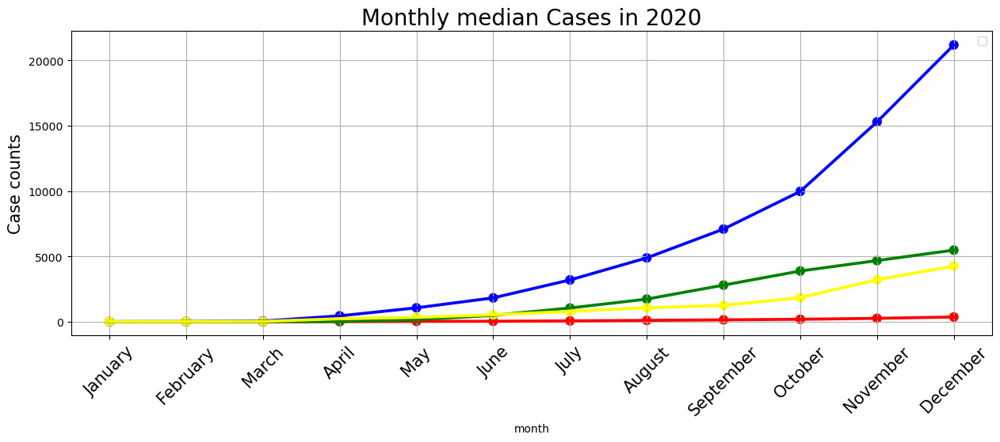

In [41]:
monthly_medians(covid_2020_group, 2020, np.arange(12), months)

No handles with labels found to put in legend.


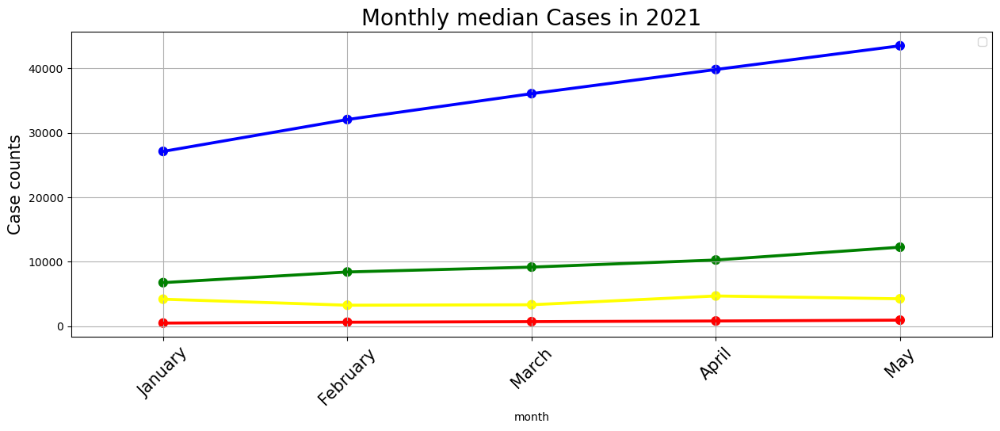

In [42]:
monthly_medians(covid_2021_group, 2021, np.arange(5), months[:5])

In [43]:
def line_plot(style, width, height, x_series, y_series, n, months_label, year, colour):
    plt.style.use(style)
    fig = plt.figure(figsize=(width, height))
    plt.title(f"\nWorldwide {y_series.name} cases in {year}")
    plt.plot(x_series, y_series, colour)
    plt.xticks(ticks=np.arange(1, n+1), labels=months_label, rotation = 45)
    plt.xticks(rotation = 45)
    plt.grid(True)
    plt.show()
    fig.savefig(f'{y_series.name}_{year}.png')

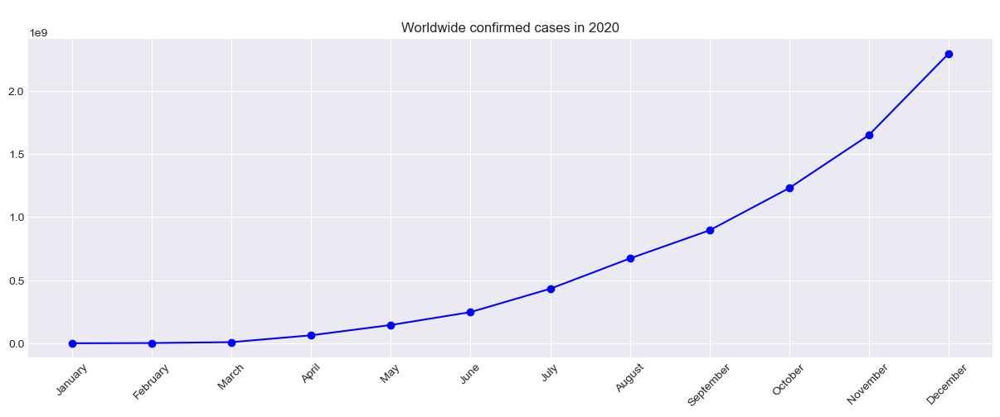

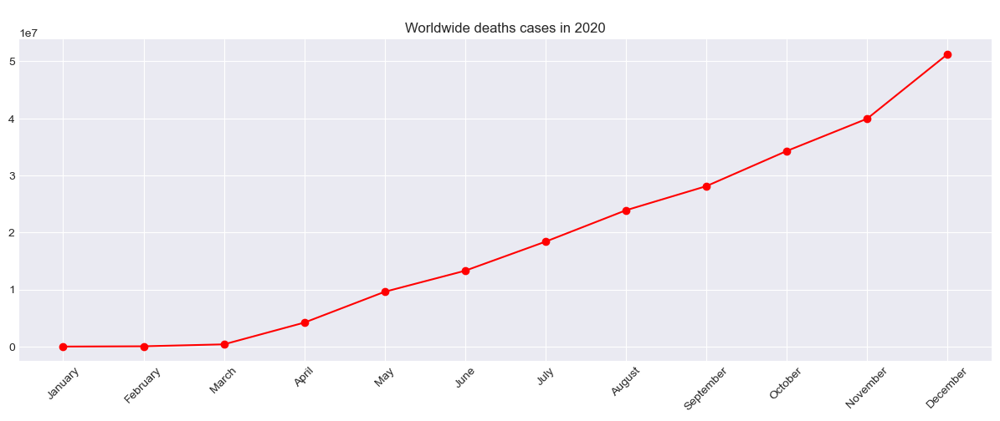

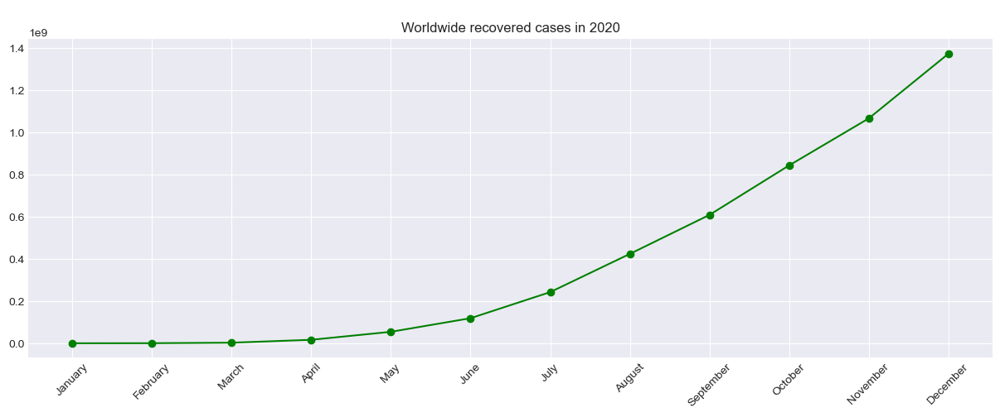

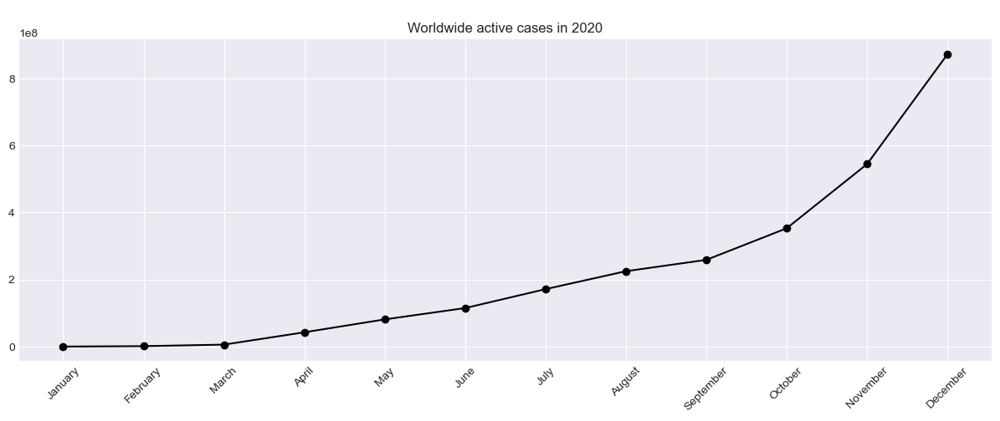

In [44]:
colors = ['b-o', 'r-o', 'g-o', 'k-o']
i=0
for col in covid_2020.columns[3:-2]:
    line_plot('seaborn-dark', 15,5, covid_2020_group.month.median(), covid_2020_group.sum()[col], 12, months_2020, 2020, colors[i])
    i+=1

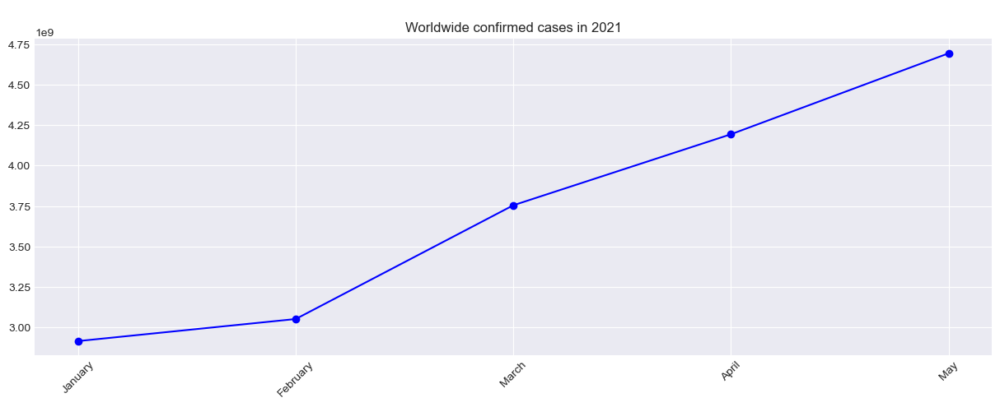

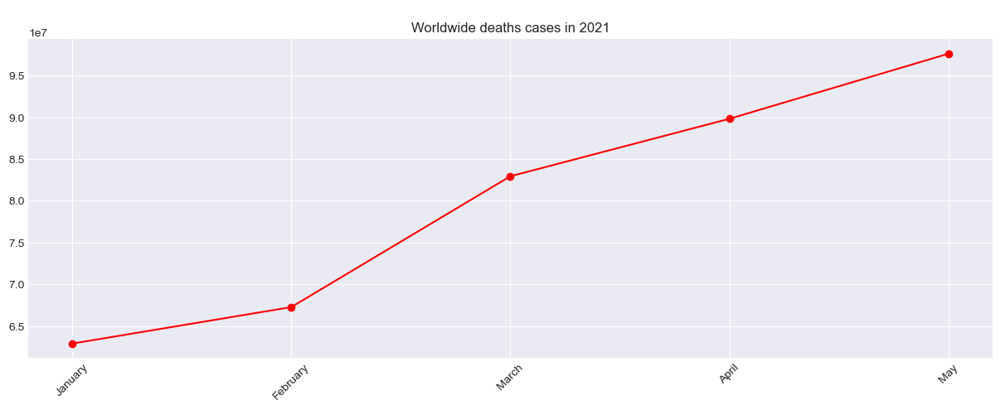

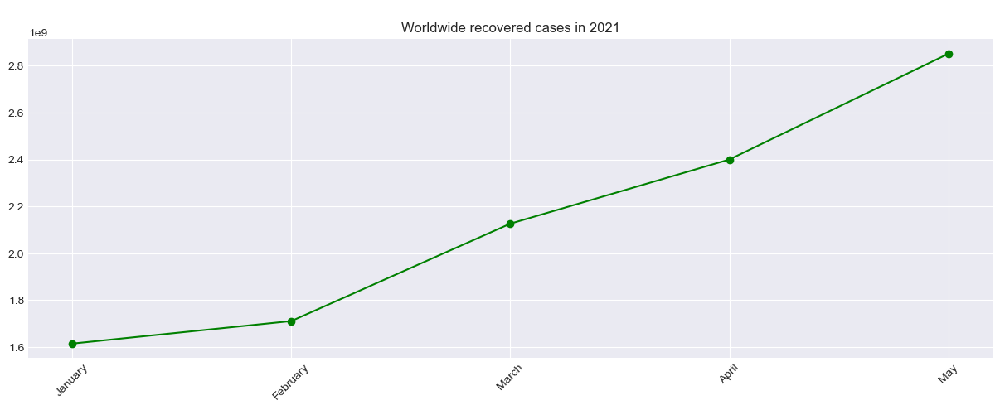

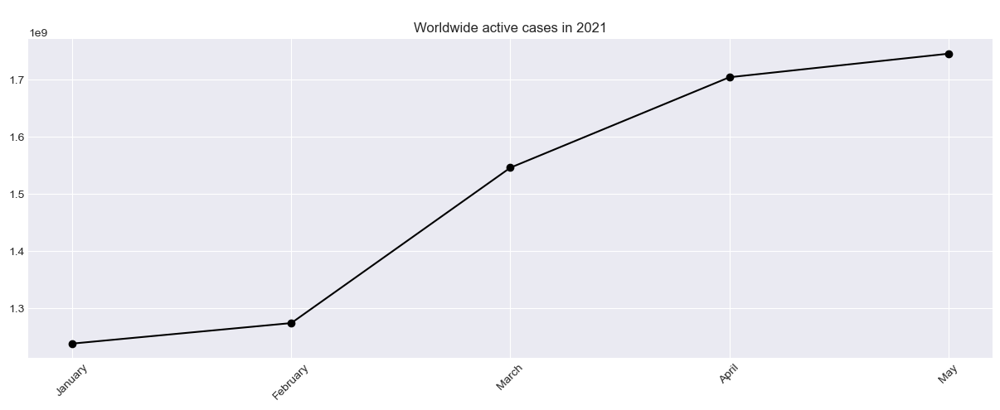

In [45]:
colors = ['b-o', 'r-o', 'g-o', 'k-o']
i=0
for col in covid_2021.columns[3:-2]:
    line_plot('seaborn-dark', 15,5, covid_2021_group.month.median(), covid_2021_group.sum()[col], 5, months_2021, 2021, colors[i])
    i+=1

In [46]:
def bivariate_bar_plot(style, width, height,
                       x_series1, y_series1,
                       x_series2, y_series2,
                       months):
    bar_width = 0.4
    plt.style.use(style)
    fig = plt.figure(figsize=(width, height))
    plt.title(f"\nMonthly {y_series1.name} cases in 2020 & 2021")
    plt.bar(x=x_series1 - bar_width/2, height=y_series1, width=bar_width, color='red', label= '2020', edgecolor='Black')
    plt.bar(x=x_series2 + bar_width/2, height=y_series2, width=bar_width, color='yellow', label= '2021', edgecolor='Black')
    plt.xticks(ticks=np.arange(12), labels=months, rotation=45)
    plt.legend()
    plt.grid(True)
    fig.savefig(f'monthly_{y_series1.name}.png')

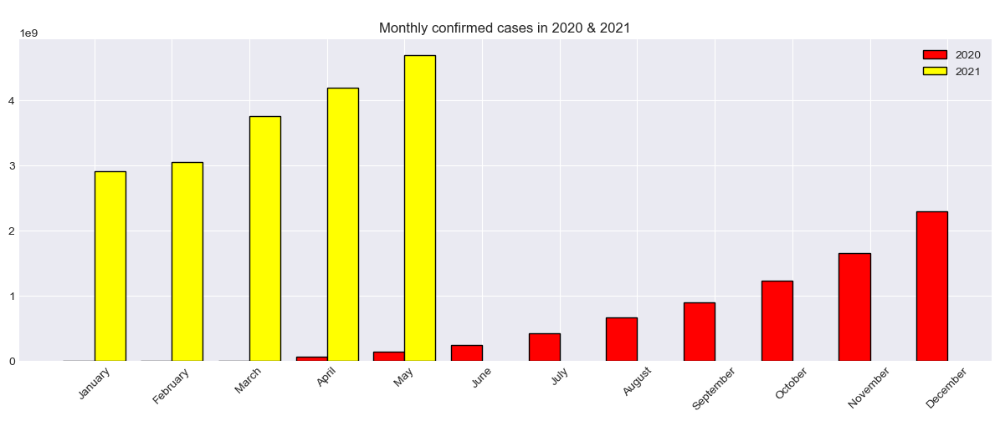

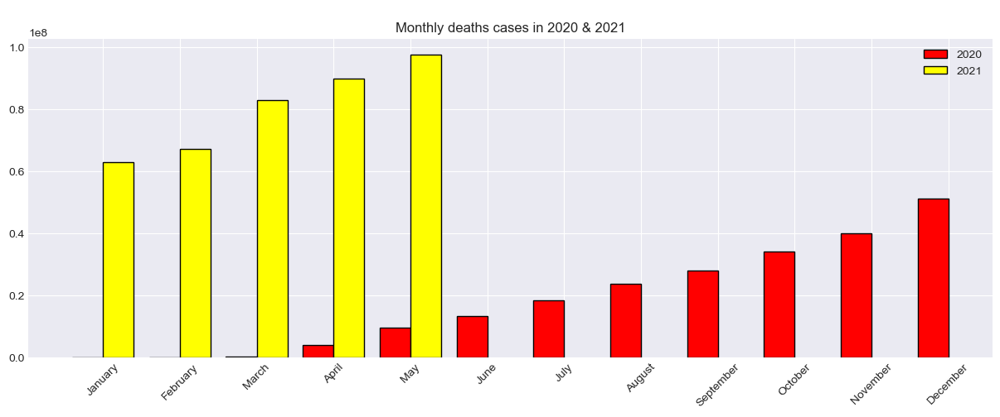

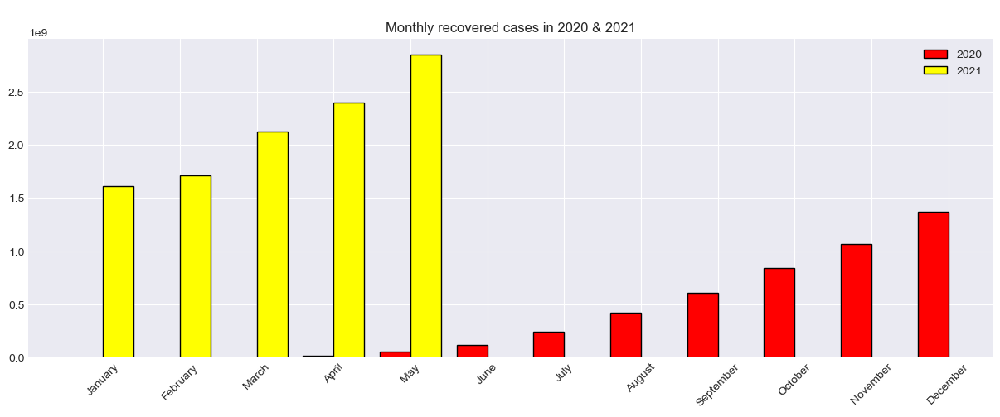

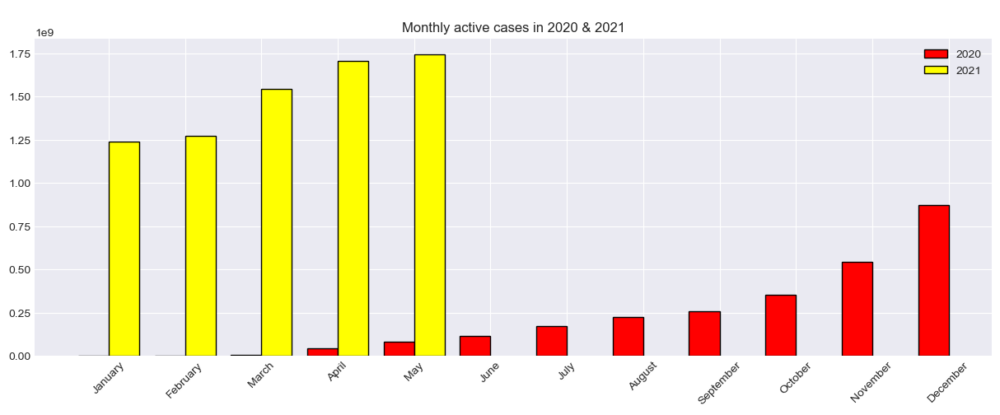

In [47]:
for col in covid_df.columns[3:-2]:
    bivariate_bar_plot('seaborn-dark', 15, 5,
                      np.arange(12), covid_2020_group.sum()[col],
                      np.arange(5), covid_2021_group.sum()[col],
                      months)

### Total number of confirmed, death and recovered cases

In [48]:
confirmed_total = int(covid_df['confirmed'].sum())
deaths_total = int(covid_df['deaths'].sum())
recovered_total = int(covid_df['recovered'].sum())
active_total = int(covid_df['active'].sum())

In [49]:
# displaying the total stats

display(HTML("<div style = 'background-color: Lightgray; padding: 30px '>" +
             "<span style='color: black; font-size:30px;margin-left:20px;'> Confirmed: "  + str(confirmed_total) + "<br>" +
             "<span style='color: DarkRed; font-size:30px;margin-left:20px;'> Deaths: " + str(deaths_total) + "<br>"+
             "<span style='color: darkgreen; font-size:30px; margin-left:20px;'> Recovered: " + str(recovered_total) + "</span>"+
             "</div>")
       )

# COVID-19 Confirmed/Death/Recovered cases by countries

### Grouping the records countrywise

In [50]:
covid_df_1 = covid_df.groupby(by = ['country'], as_index=False).agg({'confirmed': 'sum', 
                                                                     'deaths': 'sum', 
                                                                     'recovered': 'sum',
                                                                     'active': 'sum', 
                                                                     'year': 'first'})                                      
covid_df_1.head()

,country,confirmed,deaths,recovered,active,year
0,Azerbaijan,1.0,0.0,0.0,1.0,2020
1,"('St. Martin',)",2.0,0.0,0.0,2.0,2020
2,Afghanistan,17026442.0,669075.0,13464399.0,2892968.0,2020
3,Albania,19768869.0,375955.0,13945256.0,5447658.0,2020
4,Algeria,27684358.0,834464.0,18959299.0,7890595.0,2020


In [51]:
covid_df_1[covid_df_1.country == 'China']

,country,confirmed,deaths,recovered,active,year
43,China,0.0,0.0,0.0,0.0,2020


In [52]:
covid_df_1.drop(labels=43, axis=0, inplace=True)

In [53]:
# sorting the values by confirmed descending order

fig = go.FigureWidget( layout=go.Layout() )
def highlight_col(x):
    y = 'background-color: teal'
    r = 'background-color: red'
    g = 'background-color: green'
    gr = 'background-color: grey'
    df1 = pd.DataFrame('', index=x.index, columns=x.columns)
    df1.iloc[:, 1] = y
    df1.iloc[:, 2] = r
    df1.iloc[:, 3] = g
    df1.iloc[:, 4] = gr
    
    return df1

def show_latest_cases(n):
    n = int(n)
    return covid_df_1.sort_values('confirmed', ascending= False).head(n).style.apply(highlight_col, axis=None)

interact(show_latest_cases, n='10')

interactive(children=(Text(value='10', description='n'), Output()), _dom_classes=('widget-interact',))

<function __main__.show_latest_cases(n)>

In [54]:
def world_maps(columns, color):
    fig = px.choropleth(covid_df_1,locations="country",
                        locationmode='country names' 
                       ,color=columns,
                        hover_name="country",
                        range_color=[1,1000000],
                        color_continuous_scale=color,
                        title=f"Countries with {columns.upper()} Cases")
    fig.show()

In [55]:
colors = ["solar", "Peach", "greens", "oranges"]
i=0
for col in covid_df_1.columns[1:-1]:
    world_maps(col, colors[i])
    i+=1

In [56]:
sorted_covid_df = covid_df_1.sort_values('confirmed', ascending= False)
sorted_covid_df.head()

,country,confirmed,deaths,recovered,active,year
214,US,6.049145e+09,123303759.0,5.033710e+08,5.422470e+09,2020
96,India,3.226768e+09,44424723.0,2.900590e+09,2.817535e+08,2020
27,Brazil,2.653588e+09,72624610.0,2.313677e+09,2.672859e+08,2020
172,Russia,9.305488e+08,18363719.0,7.907057e+08,1.214794e+08,2020
71,France,8.551890e+08,22720818.0,6.940743e+07,7.630607e+08,2020


In [57]:
def bubble_chart(n):
    fig = px.scatter(sorted_covid_df.head(n), x="country", y="confirmed", size="confirmed", color="country",
                   hover_name="country", size_max=60)
    fig.update_layout(
        title=str(n) +" Worst hit countries",
        xaxis_title="Countries",
        yaxis_title="Confirmed Cases",
        width = 1000
        )
    fig.show()
    
interact(bubble_chart, n=10)

interactive(children=(IntSlider(value=10, description='n', max=30, min=-10), Output()), _dom_classes=('widget-…

<function __main__.bubble_chart(n)>

### Top 5 country records with most confirmed cases

#### Barplot for showing worldwide top 5 confirmed cases vs their death and recovery 

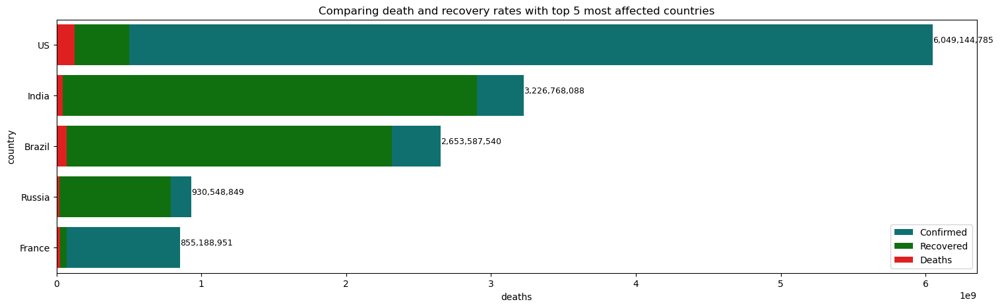

In [58]:
plt.style.use('default')
fig = plt.figure(figsize=(18, 5))
plt.title('Comparing death and recovery rates with top 5 most affected countries')

confirmed = sns.barplot(sorted_covid_df['confirmed'].head(), sorted_covid_df['country'].head(),color = 'teal', label = 'Confirmed')
recovered = sns.barplot(sorted_covid_df['recovered'].head(), sorted_covid_df['country'].head(),color = 'green', label = 'Recovered')
death = sns.barplot(sorted_covid_df['deaths'].head(), sorted_covid_df['country'].head(),color = 'red', label = 'Deaths')

for i,(value, name) in enumerate(zip(sorted_covid_df['confirmed'].head(), sorted_covid_df['country'].head())):
    confirmed.text(value,i-0.05,f'{value:,.0f}',size=9) 
plt.legend()
fig.savefig('comparison5.png')

#### Observation found: The recovery rate in US is least compared to its confirmed cases

## Top 10 countries with most cases

In [59]:
def bar_plot(column):
    fig = px.bar(covid_df_1.sort_values(column, ascending= False).head(10),
                 x = "country",
                 y = column,
                 title= f"Top 10 countries with most {column.upper()} cases",
                 color=column,
                 height=500,
                 width=800)
    fig.show()

In [60]:
for col in covid_df_1.columns[1:-1]:
    bar_plot(col)

In [61]:
fig = px.bar(covid_df_1.sort_values(('confirmed'), ascending= True).head(10),
x = "country",y = "confirmed",
title= f"Top 10 countries with least CONFIRMED cases",
color="confirmed",height=500,width=800)

fig.show()

# Global spread of COVID-19

In [62]:
world_map = folium.Map(location=[11,0], tiles="cartodbpositron", zoom_start=2, max_zoom = 6, min_zoom = 2)

for i in range(0,len(confirmed_df)):
    folium.Circle(
        location=[confirmed_df.iloc[i]['lat'], confirmed_df.iloc[i]['long']],
        fill=True,
        radius=(int((np.log(confirmed_df.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='red',
        fill_color='indigo',
        tooltip = "<div style='margin: 0; background-color: black; color: white;'>"+
                    "<h4 style='text-align:center;font-weight: bold'>"+confirmed_df.iloc[i]['country'] + "</h4>"
                    "<hr style='margin:10px;color: white;'>"+
                    "<ul style='color: white;;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
                        "<li>Confirmed: "+str(confirmed_df.iloc[i,-1])+"</li>"+
                        "<li>Deaths:   "+str(death_df.iloc[i,-1])+"</li>"+
                        "<li>Death Rate: "+ str(np.round(death_df.iloc[i,-1]/(confirmed_df.iloc[i,-1]+1.00001)*100,2))+ "</li>"+
                    "</ul></div>",
        ).add_to(world_map)

world_map

## COVID-19: Progression of spread

In [63]:
d1 = covid_df.groupby(['last_update', 'country'])['confirmed', 'deaths'].max().reset_index()
d1["last_update"] = d1["last_update"].dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(d1, locations="country", locationmode='country names', 
                     color=np.power(d1["confirmed"],0.3)-2 , size= np.power(d1["confirmed"]+1,0.3)-1, hover_name="country",
                     hover_data=["confirmed"],
                     range_color= [0, max(np.power(d1["confirmed"],0.3))], 
                     projection="natural earth", animation_frame="last_update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [64]:
covid_df_2 = covid_df.set_index('observationdate')
covid_df_2.head()

,country,last_update,confirmed,deaths,recovered,active,year,month
observationdate,,,,,,,,
2020-01-22,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0,2020,1
2020-01-22,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0,2020,1
2020-01-22,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0,2020,1
2020-01-22,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0,2020,1
2020-01-22,Mainland China,2020-01-22 17:00:00,26.0,0.0,0.0,26.0,2020,1


In [65]:
def calender_plot(year):
    f = plt.figure(figsize=(20,10))
    f.add_subplot(2,1,1)
    calmap.yearplot(covid_df_2['confirmed'], fillcolor='white', 
                    cmap='Blues', linewidth=0.5,linecolor="#fafafa",
                    monthlabels=["J","F","M","A","M","J","J","A","S","O","N","D"],
                   year=year)
    plt.title("Daily Confirmed Cases",fontsize=20)
    plt.tick_params(labelsize=15)

    f.add_subplot(2,1,2)
    calmap.yearplot(covid_df_2['deaths'], fillcolor='white', cmap='Reds', linewidth=1,linecolor="#fafafa",year=year)
    plt.title("Daily Deaths Cases",fontsize=20)
    plt.tick_params(labelsize=15)
    plt.show()
    f.savefig(f'calender_{year}.png')

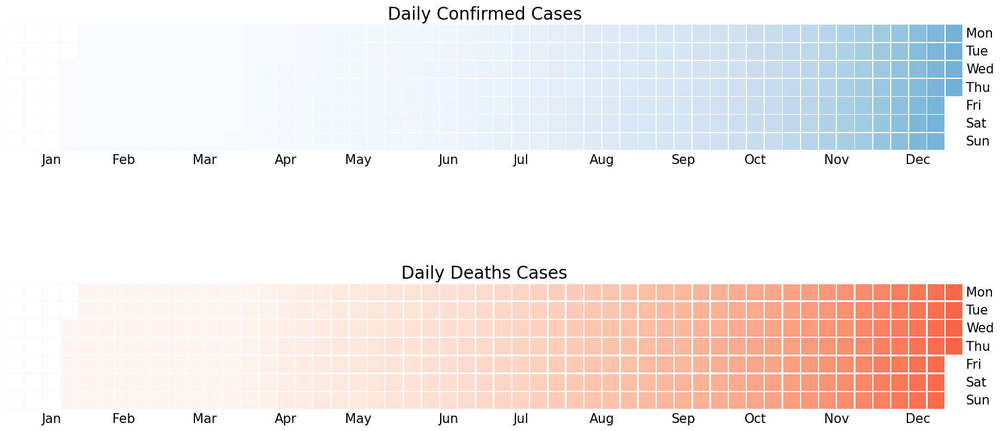

In [66]:
calender_plot(2020)

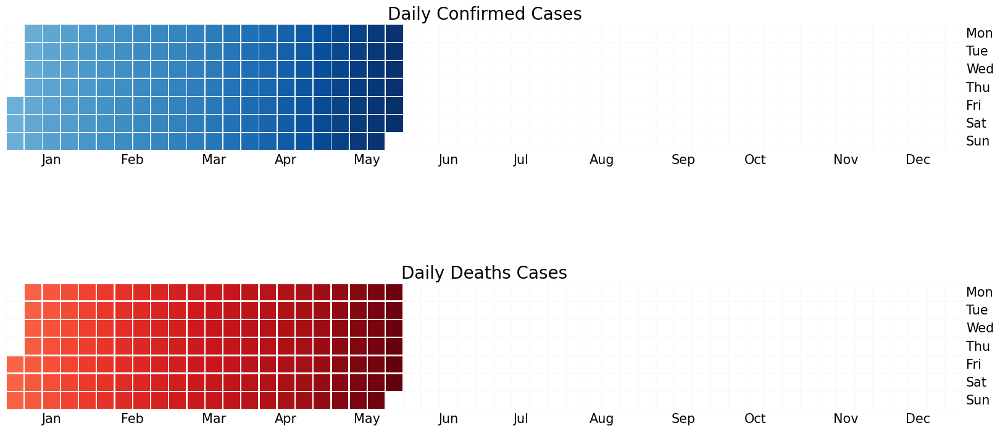

In [67]:
calender_plot(2021)

## Covid-19 Analysis on Mainland China

In [68]:
china_df = covid_df[covid_df.country == "Mainland China"]
china_df.drop(columns=['observationdate', 'last_update'], inplace=True)
china_df = china_df.groupby(by='month')['confirmed','deaths', 'recovered', 'active'].sum().reset_index()
china_df

,month,confirmed,deaths,recovered,active
0,1,2773345.0,144567.0,2556942.0,71836.0
1,2,4145232.0,176188.0,2740087.0,1228957.0
2,3,5298892.0,242090.0,4648245.0,408557.0
3,4,5183512.0,257250.0,4884444.0,41818.0
4,5,5206328.0,278083.0,4914135.0,14110.0
5,6,2497323.0,139020.0,2351613.0,6690.0
6,7,2595103.0,143654.0,2440267.0,11182.0
7,8,2628794.0,143654.0,2467241.0,17899.0
8,9,2557006.0,139020.0,2412748.0,5238.0
9,10,2655726.0,143654.0,2504202.0,7870.0


In [69]:
def countrywise_case_count(df, country):
    fig = plt.figure(figsize=(20,8))
    sns.lineplot(df['month'],df.confirmed,color="Blue", label='Confirmed')
    sns.lineplot(df['month'],df.deaths,color="Red", label='Deaths')
    sns.lineplot(df['month'],df.recovered,color="Green", label='Recovered')
    sns.lineplot(df['month'],df.active,color="Yellow", label='Active')
    plt.title(f"Cases over time in {country.upper()}", fontsize=20)
    plt.ylabel("Cases",fontsize=15)
    plt.xticks(ticks=np.arange(1, 13), labels = months)
    plt.xlabel("No. Of Days",fontsize=15)
    plt.legend()
    plt.show()
    fig.savefig(f'{country}')

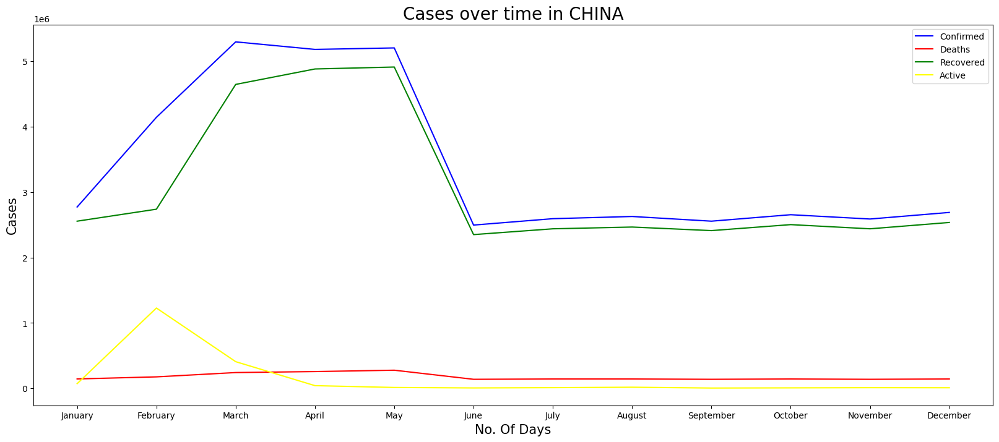

In [70]:
countrywise_case_count(china_df, 'china')